In [1]:
# input
data_nodes_input_path = '..\\output\\final_data_nodes.GEOJSON'
random_seed = 4

x_cols = ['maxspeed', 'bridge', 'junction', 'building_height',
          'dist_to_train', 'dist_to_recreation', 'landuse_is_residential', 
          'landuse_is_commercial', 'landuse_is_industrial', 'rt_highway', 
          'rt_trunk', 'rt_primary', 'rt_secondary','rt_tertiary', 
          'rt_unclassified', 'rt_residential', 'rt_living_street',
          'rt_busway', 'rt_service',]
c_cols = ['x', 'y']

In [2]:
import os
import sys
import random
import numpy as np
import pandas as pd
import geopandas as gpd
import contextily as cx
pd.options.mode.copy_on_write = True
pd.set_option('display.max_columns', 500)
# libs
from sklearn.ensemble import RandomForestRegressor
from pykrige.rk import RegressionKriging
from sklearn.metrics import r2_score, root_mean_squared_error

import matplotlib as mpl
import matplotlib.pyplot as plt


In [3]:
class HiddenPrints:
    def __enter__(self):
        self._original_stdout = sys.stdout
        sys.stdout = open(os.devnull, 'w')

    def __exit__(self, exc_type, exc_val, exc_tb):
        sys.stdout.close()
        sys.stdout = self._original_stdout

In [4]:
gdf = gpd.read_file(data_nodes_input_path, engine='pyogrio')
gdf_measured = gdf[gdf['dBA_raw'].notna()]
gdf_measured_slt20 = gdf[gdf['dBA_raw_slt20'].notna()]

def create_spatial_folds(df, no_of_folds=16):

    def create_fold_arr(sorted_df, no_folds):
        fold_arr = np.concatenate([np.full((sorted_df.shape[0] // no_folds), i) for i in range(no_folds-1)])
        fold_arr = np.concatenate((fold_arr, np.full(sorted_df.shape[0]-len(fold_arr), no_folds-1)))
        return fold_arr
    # no_of_folds must be the square of some integer (i.e. 1,4,9,16,...)
    df = df.sort_values(by=['x', 'y']).reset_index(drop=True)
    df['xf'] = create_fold_arr(df, int(np.sqrt(no_of_folds)))
    df = df.sort_values(by=['xf', 'y']).reset_index(drop=True)
    df['fold'] = create_fold_arr(df, no_of_folds)
    return df

def spatial_train_test_split(gdf, no_test_folds, random_state=1, fold_col='fold'):
    """
    spatial folds
    """
    random.seed(random_state)
    folds = gdf[fold_col].unique()
    random.shuffle(folds)
    print(folds)
    return gdf[gdf[fold_col].isin(folds[no_test_folds:])], gdf[gdf[fold_col].isin(folds[:no_test_folds])]

gdf_measured = create_spatial_folds(gdf_measured)
gdf_measured_slt20 = create_spatial_folds(gdf_measured_slt20)
train_measured, test_measured = spatial_train_test_split(gdf_measured, 6, random_seed)
train_slt20, test_slt20 = spatial_train_test_split(gdf_measured_slt20, 6, random_seed)


[10  5 12  9 14  3  0  8 13  2 15  6 11  1  4  7]
[10  5 12  9 14  3  0  8 13  2 15  6 11  1  4  7]


In [5]:
def get_new_model():
    model = RandomForestRegressor
    model_parameters = {'n_estimators': 50,
                        'max_depth': 10,
                        'min_samples_split': 10,
                        'min_samples_leaf': 4,
                        'max_features': 2,
                        'random_state': 12}
    kriging_parameters = {'n_closest_points': 20, 
                          'nlags': 6}

    return RegressionKriging(model(**model_parameters), **kriging_parameters)



In [6]:
gdf.columns

Index(['y', 'x', 'dBA_rivm', 'no_observations', 'speed', 'speed_slt20',
       'dBA_raw', 'dBA_raw_slt20', 'dBA_noise_red', 'dBA_noise_red_slt20',
       'dBA_reg_adj', 'dBA_reg_adj_slt20', 'dBA_dual_red',
       'dBA_dual_red_slt20', 'maxspeed', 'bridge', 'junction', 'rt_highway',
       'rt_trunk', 'rt_primary', 'rt_secondary', 'rt_tertiary',
       'rt_unclassified', 'rt_residential', 'rt_living_street', 'rt_busway',
       'rt_service', 'sub_area', 'dist_to_train', 'dist_to_recreation',
       'landuse_is_residential', 'landuse_is_commercial',
       'landuse_is_industrial', 'building_height', 'geometry'],
      dtype='object')

In [14]:
# Overview of desired plots

# ┏━━━━━━━━━┑ ┏━━━┑     
# ┃         ┃ ┃ b ┃     Graph Key:  
# ┃   a     ┃ ┗━━━┛     a. Dual Red
# ┃     a   ┃ ┏━━━┑     b. Measurements
# ┃         ┃ ┃ c ┃     c. RIVM
# ┗━━━━━━━━━┛ ┗━━━┛     d. Raw
# ┏━━━┑ ┏━━━┑ ┏━━━┑     e. SLT 20 (Noise Red)
# ┃ d ┃ ┃ e ┃ ┃ f ┃     f. Lunetten Trained (Dual Red)
# ┗━━━┛ ┗━━━┛ ┗━━━┛     



def create_plotting_gdf(gdf, gdf_measured, gdf_measured_slt20):
    gdf = gdf.rename(columns={'dBA_rivm': 'C_rivm', 'dBA_raw': 'B_measurements'})
    # train dual red model
    m = get_new_model()
    m.fit(gdf_measured[x_cols].values, gdf_measured[c_cols].values, gdf_measured['dBA_dual_red'].values)
    gdf['A_dual_red'] = m.predict(gdf[x_cols].values, gdf[c_cols].values)
    # train raw model
    m = get_new_model()
    m.fit(gdf_measured[x_cols].values, gdf_measured[c_cols].values, gdf_measured['dBA_raw'].values)
    gdf['D_raw'] = m.predict(gdf[x_cols].values, gdf[c_cols].values)
    # train slt model
    m = get_new_model()
    m.fit(gdf_measured_slt20[x_cols].values, gdf_measured_slt20[c_cols].values, gdf_measured_slt20['dBA_noise_red'].values)
    gdf['E_slt20'] = m.predict(gdf[x_cols].values, gdf[c_cols].values)
    # train lunetten model
    gdf_measured = gdf_measured[gdf_measured['sub_area'] == 'Lunetten']
    m = get_new_model()
    m.fit(gdf_measured[x_cols].values, gdf_measured[c_cols].values, gdf_measured['dBA_dual_red'].values)
    gdf['F_lun_trained'] = m.predict(gdf[x_cols].values, gdf[c_cols].values)
    
    return gdf[['geometry', 'sub_area', 'A_dual_red', 'B_measurements', 'C_rivm', 'D_raw', 'E_slt20', 'F_lun_trained']]

def get_color_norm(plotting_gdf, desired_plots):
    area_min = plotting_gdf[desired_plots].min().min()
    area_max = plotting_gdf[desired_plots].max().max()
    return mpl.colors.Normalize(vmin=area_min, vmax=area_max)

def create_plots(plotting_gdf, desired_plots, cmap='viridis'):
    print(f'Generating plots for sub area(s): {plotting_gdf['sub_area'].unique()}\n----------------------------------------------')
    norm = get_color_norm(plotting_gdf, desired_plots)

    for plot_name in desired_plots:
        print(plot_name)
        fig, ax = plt.subplots(1,1, figsize=(4,4))
        plotting_gdf.plot(column=plot_name, marker='s', markersize=2, ax=ax,
                          norm=norm, cmap=cmap)
        cx.add_basemap(ax=ax, source=cx.providers.nlmaps.grijs, crs=plotting_gdf.crs, attribution=False)
        
        ax.set_axis_off()
        plt.show()

    fig, ax = plt.subplots(1,1, figsize=(5,2))
    fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax, orientation='horizontal')
    plt.show()




In [8]:
plotting_gdf = create_plotting_gdf(gdf, gdf_measured, gdf_measured_slt20)

Finished learning regression model
Finished kriging residuals
Finished learning regression model
Finished kriging residuals
Finished learning regression model
Finished kriging residuals
Finished learning regression model
Finished kriging residuals


## Lunetten

Generating plots for sub area(s): ['Lunetten']
----------------------------------------------
A_dual_red


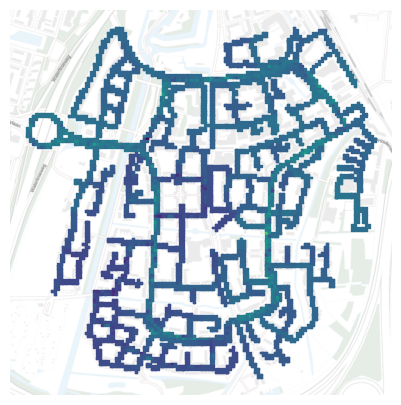

B_measurements


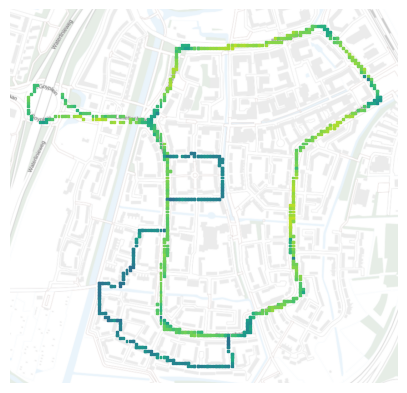

C_rivm


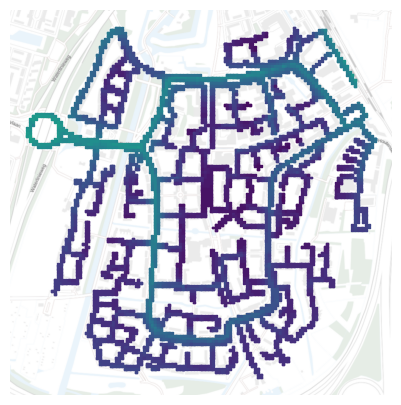

D_raw


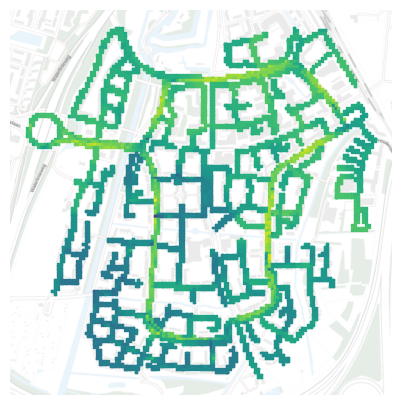

E_slt20


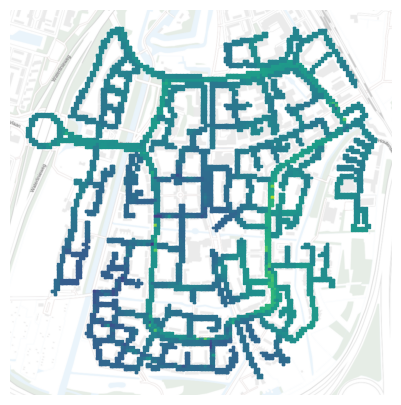

F_lun_trained


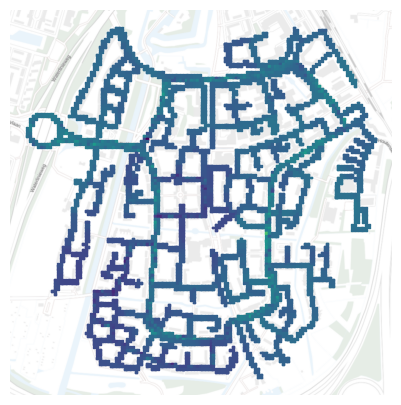

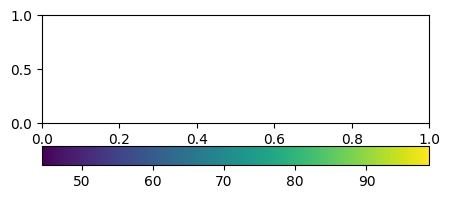

In [9]:
desired_plots = ['A_dual_red', 'B_measurements', 'C_rivm', 'D_raw', 'E_slt20', 'F_lun_trained']
create_plots(plotting_gdf[plotting_gdf['sub_area'] == 'Lunetten'], desired_plots)

Generating plots for sub area(s): ['Science Park']
----------------------------------------------
A_dual_red


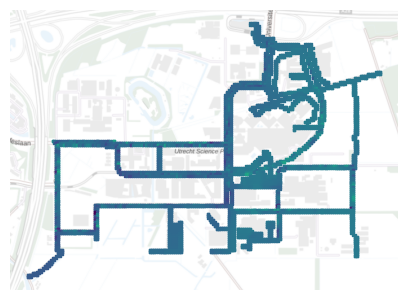

B_measurements


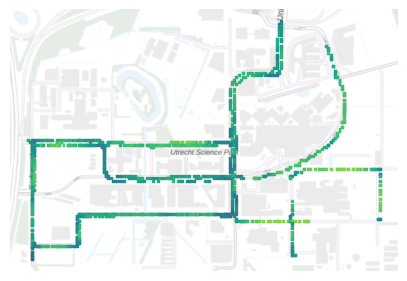

C_rivm


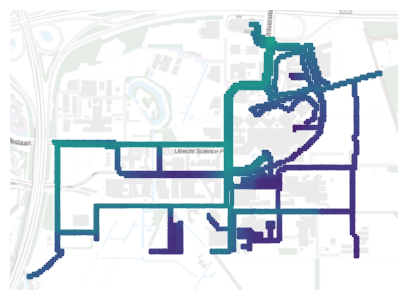

D_raw


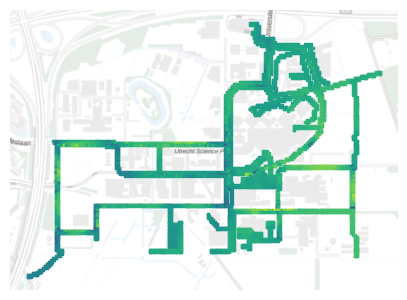

E_slt20


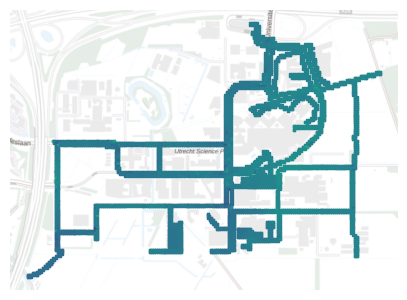

F_lun_trained


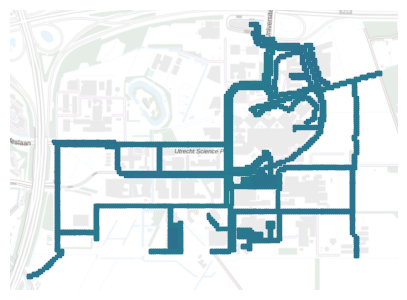

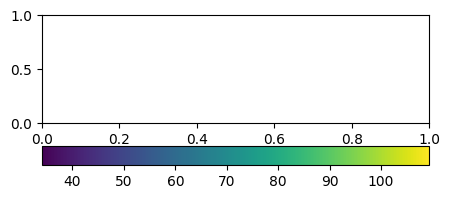

In [10]:
desired_plots = ['A_dual_red', 'B_measurements', 'C_rivm', 'D_raw', 'E_slt20', 'F_lun_trained']
create_plots(plotting_gdf[plotting_gdf['sub_area'] == 'Science Park'], desired_plots)

## Overvecht

Generating plots for sub area(s): ['Overvecht']
----------------------------------------------
A_dual_red


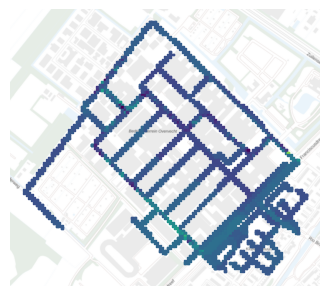

B_measurements


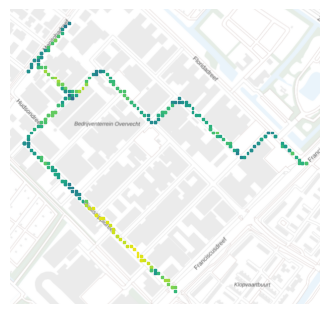

C_rivm


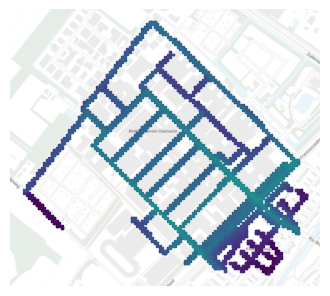

D_raw


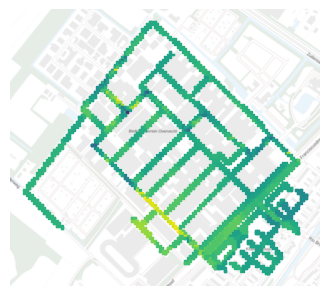

E_slt20


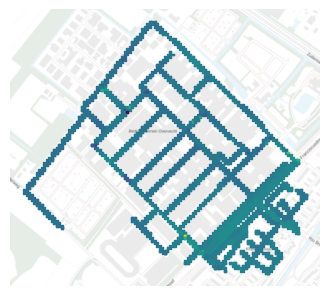

F_lun_trained


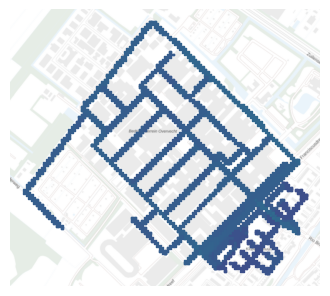

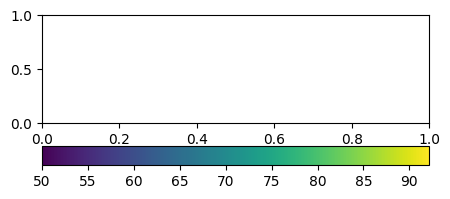

In [15]:
desired_plots = ['A_dual_red', 'B_measurements', 'C_rivm', 'D_raw', 'E_slt20', 'F_lun_trained']
create_plots(plotting_gdf[plotting_gdf['sub_area'] == 'Overvecht'], desired_plots)

Regression Kriging Predictions for dBA_raw (trained on all areas)


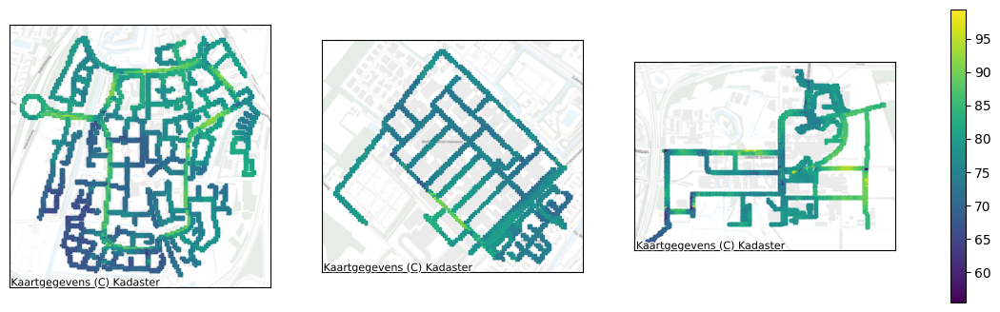

Regression Kriging Predictions for dBA_noise_red (trained on all areas)


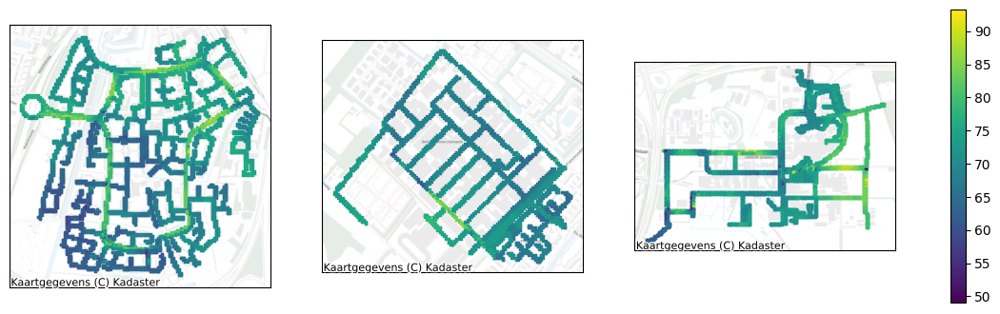

Regression Kriging Predictions for dBA_reg_adj (trained on all areas)


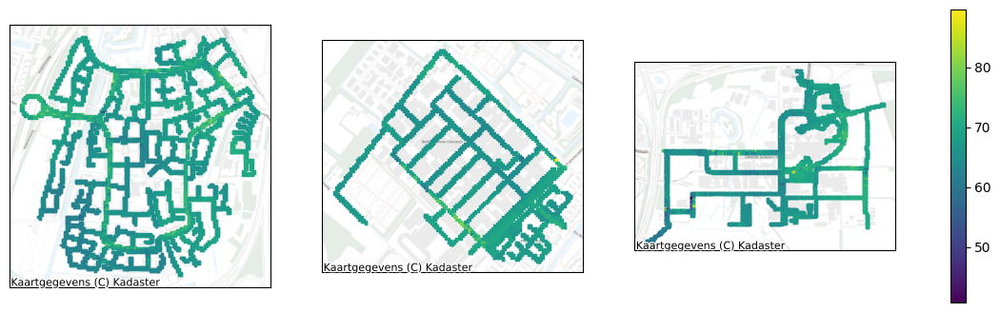

Regression Kriging Predictions for dBA_dual_red (trained on all areas)


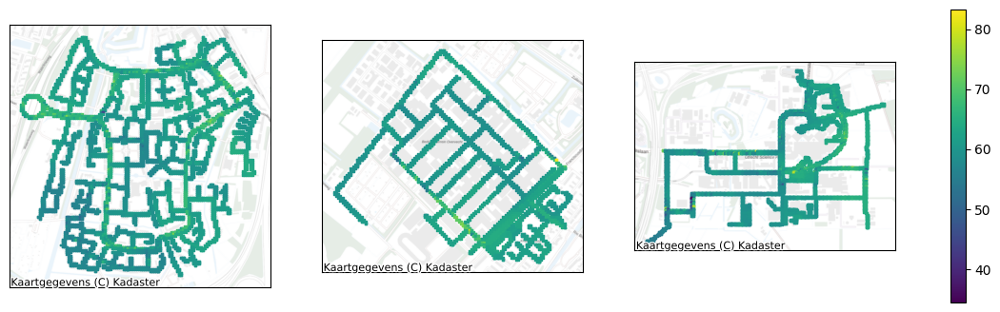

Regression Kriging Predictions for dBA_raw_slt20 (trained on all areas)


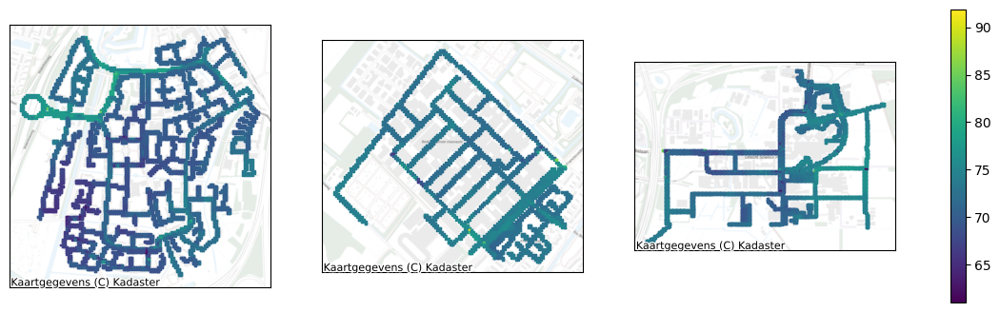

Regression Kriging Predictions for dBA_noise_red_slt20 (trained on all areas)


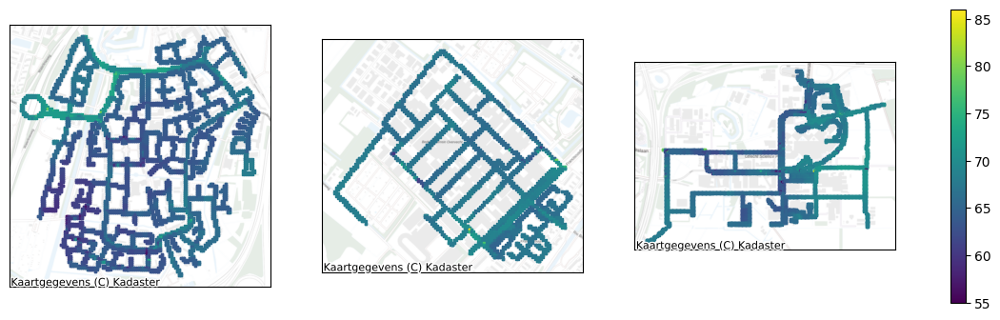

Regression Kriging Predictions for dBA_reg_adj_slt20 (trained on all areas)


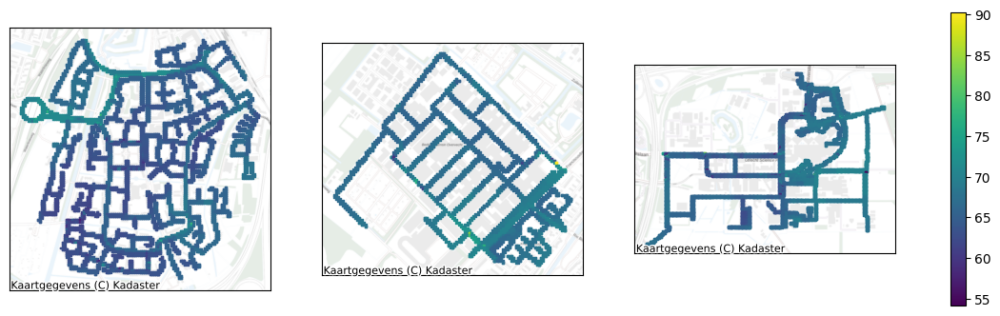

Regression Kriging Predictions for dBA_dual_red_slt20 (trained on all areas)


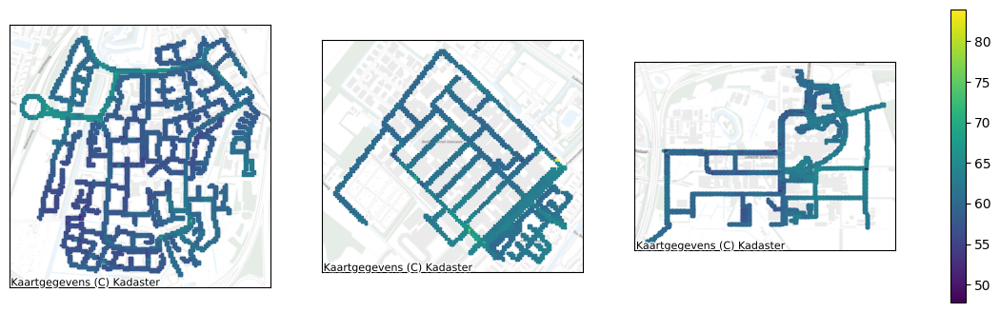

Regression Kriging Predictions for dBA_raw (trained on Lunnetten sub-area)


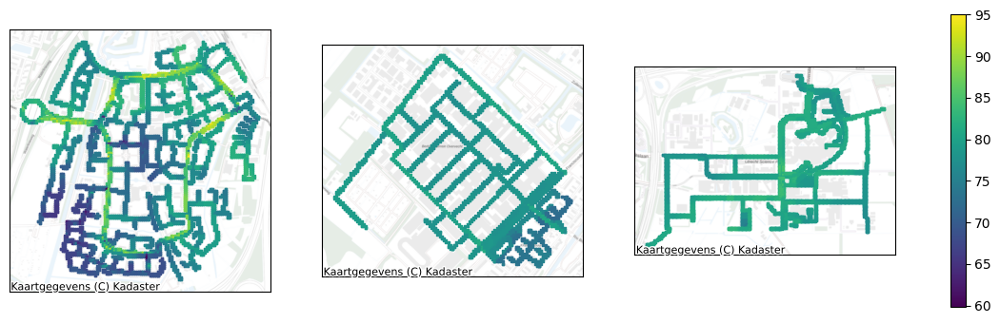

Regression Kriging Predictions for dBA_noise_red (trained on Lunnetten sub-area)


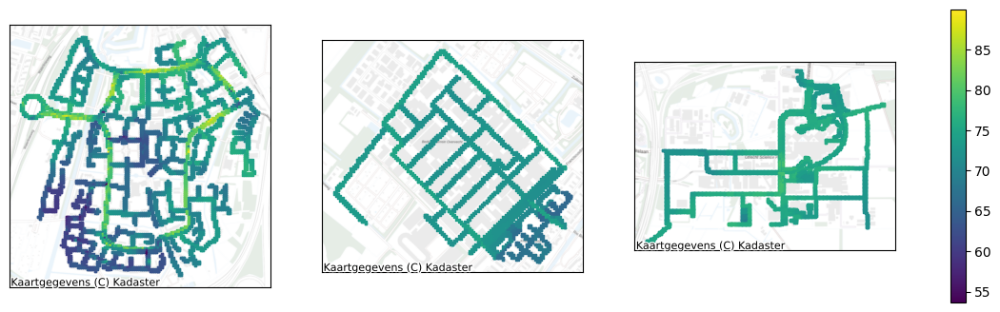

Regression Kriging Predictions for dBA_reg_adj (trained on Lunnetten sub-area)


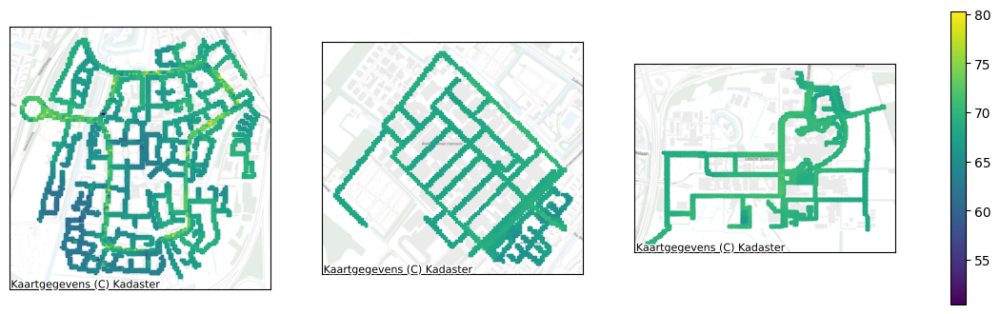

Regression Kriging Predictions for dBA_dual_red (trained on Lunnetten sub-area)


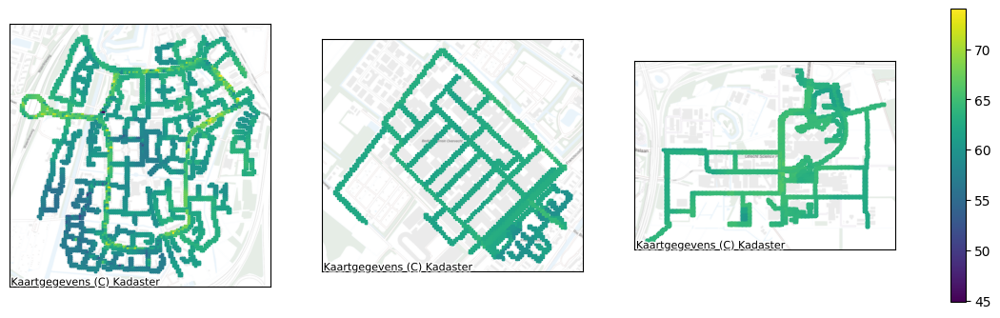

Regression Kriging Predictions for dBA_raw_slt20 (trained on Lunnetten sub-area)


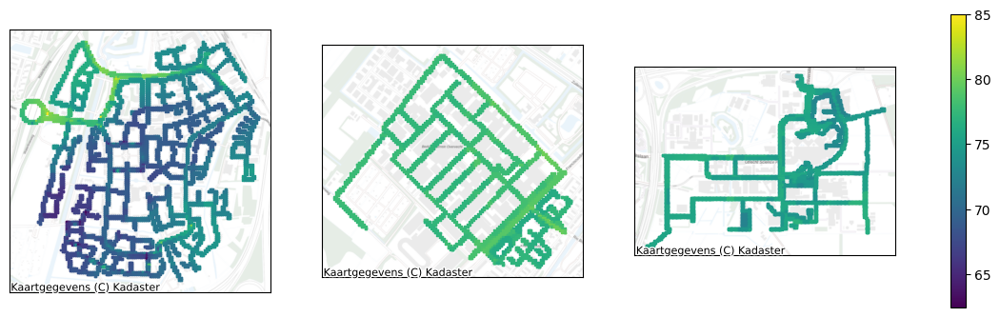

Regression Kriging Predictions for dBA_noise_red_slt20 (trained on Lunnetten sub-area)


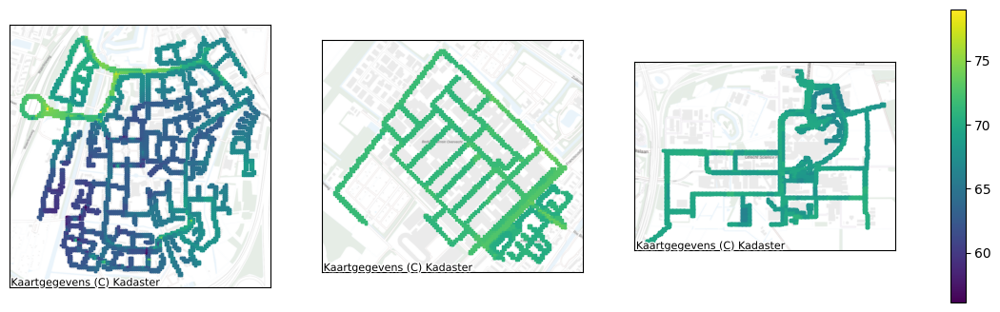

Regression Kriging Predictions for dBA_reg_adj_slt20 (trained on Lunnetten sub-area)


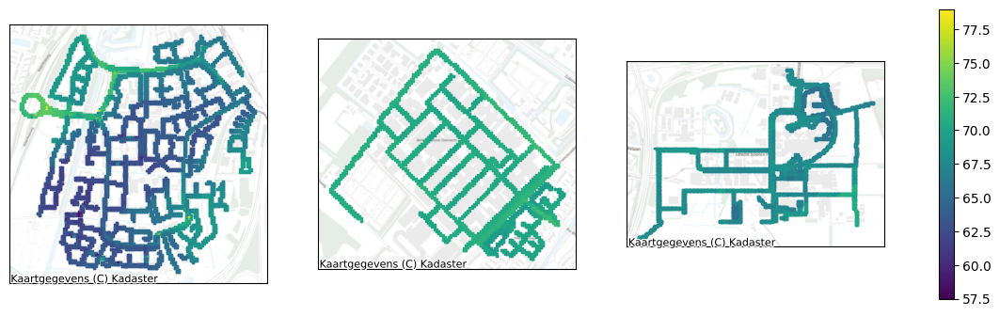

Regression Kriging Predictions for dBA_dual_red_slt20 (trained on Lunnetten sub-area)


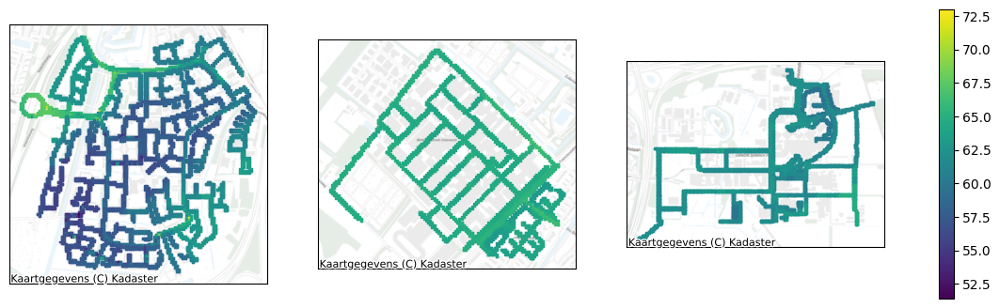

In [39]:
save_plots = True

def do_plot(train, full, ycol, only_lun=False, save_to_file=False):
    m = get_new_model()
    if only_lun:
        train = train[train['sub_area'] == 'Lunetten']
    with HiddenPrints():
        m.fit(train[x_cols].values, train[c_cols].values, train[ycol].values)
    full['p'] = m.predict(full[x_cols].values, full[c_cols].values)
    fig, axs = plt.subplots(1,3, figsize=(15,4))
    figtitle = f'Regression Kriging Predictions for {ycol} (trained on {'Lunnetten sub-area' if only_lun else 'all areas'})'
    if save_to_file: print(figtitle)
    else: fig.suptitle(figtitle)
    norm = mpl.colors.Normalize(vmin=full['p'].min(), vmax=full['p'].max())
    for i, a in enumerate((['Lunetten'], ['Overvecht'], ['Science Park'])):
        full[full['sub_area'].isin(a)].plot(column='p', marker='s', markersize=2, ax=axs[i], norm=norm)
        cx.add_basemap(ax=axs[i], source=cx.providers.nlmaps.grijs, crs=full.crs)
        axs[i].set_xticks([]); axs[i].set_yticks([])
    fig.colorbar(mpl.cm.ScalarMappable(norm=norm), ax=axs)
    if save_to_file: fig.savefig(f'figs/{ycol}-{'lun' if only_lun else 'all'}.png',bbox_inches='tight')
    plt.show()

for ar in (False, True):
    for slt in (False, True):
        for db in ('dBA_raw', 'dBA_noise_red', 'dBA_reg_adj', 'dBA_dual_red'):
            col = f'{db}_slt20' if slt else db
            if slt:
                res = do_plot(train_slt20, gdf, col, ar, save_plots)
            else:
                res = do_plot(train_measured, gdf, col, ar, save_plots)
            

In [21]:
do_model(train_measured, test_measured, 'dBA_raw')

{'r2': '0.310', 'rmse': '6.670'}

In [11]:
do_model(train_measured, test_measured, 'dBA_raw')

{'r2': '0.310', 'rmse': '6.670'}

In [12]:
do_model(train_measured, test_measured, 'dBA_raw')

{'r2': '0.310', 'rmse': '6.670'}

In [13]:
raise Exception()

Exception: 

In [ ]:
do_model(train_measured, test_measured, 'dBA_raw')

r2  : 0.310
rmse: 6.670


In [32]:
gdf.columns

Index(['y', 'x', 'dBA_rivm', 'no_observations', 'speed', 'speed_slt20',
       'dBA_raw', 'dBA_raw_slt20', 'dBA_noise_red', 'dBA_noise_red_slt20',
       'dBA_reg_adj', 'dBA_reg_adj_slt20', 'dBA_dual_red',
       'dBA_dual_red_slt20', 'maxspeed', 'bridge', 'junction', 'rt_highway',
       'rt_trunk', 'rt_primary', 'rt_secondary', 'rt_tertiary',
       'rt_unclassified', 'rt_residential', 'rt_living_street', 'rt_busway',
       'rt_service', 'sub_area', 'dist_to_train', 'dist_to_recreation',
       'landuse_is_residential', 'landuse_is_commercial',
       'landuse_is_industrial', 'building_height', 'geometry', 'p'],
      dtype='object')

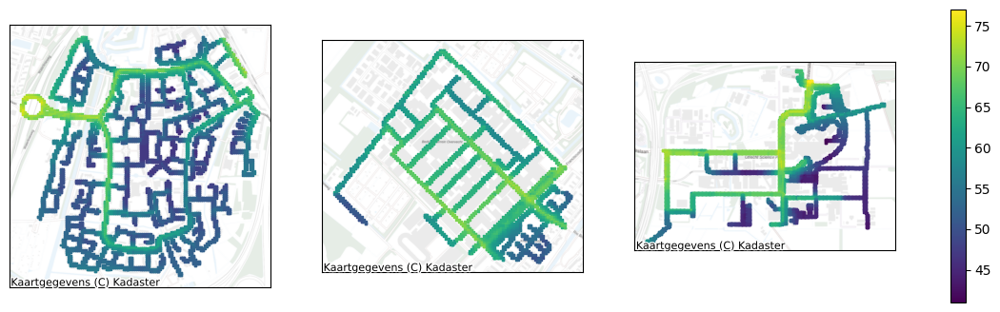

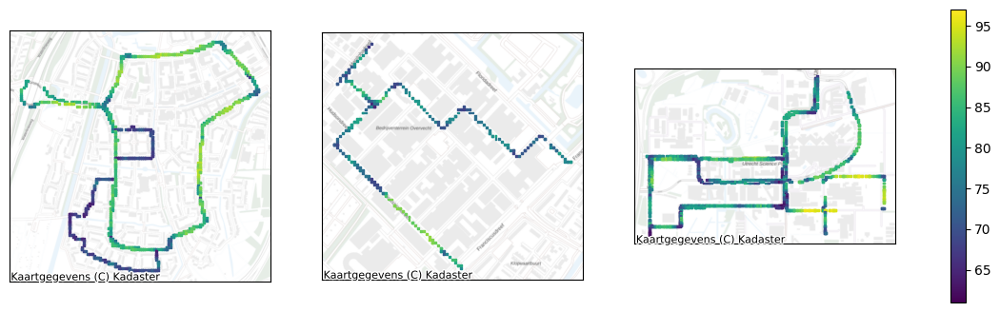

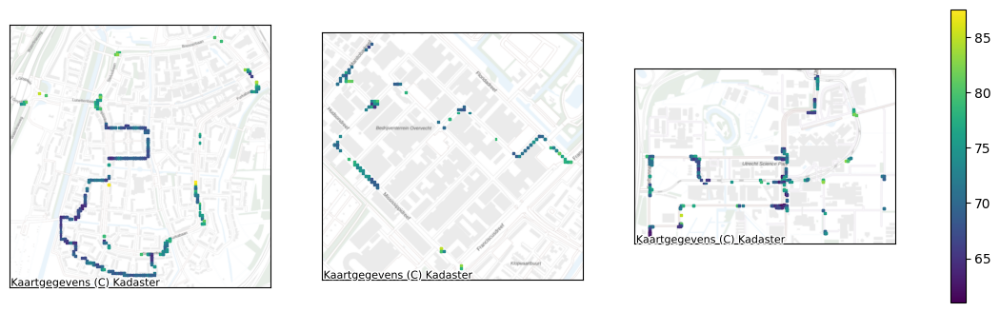

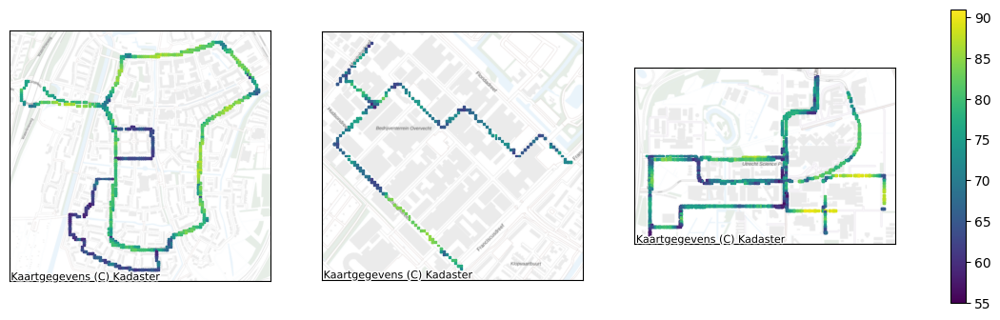

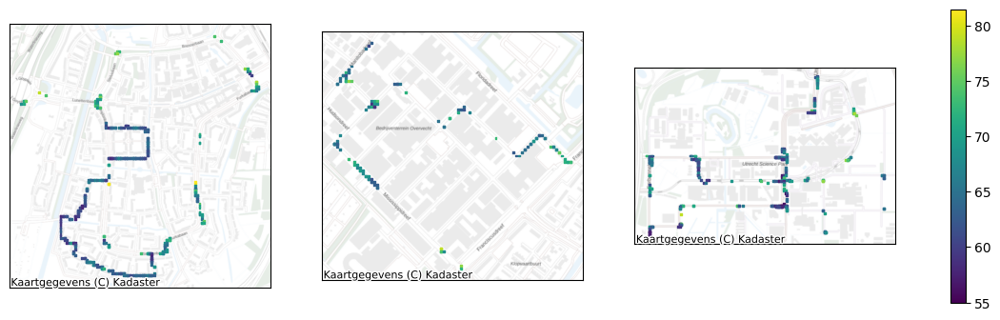

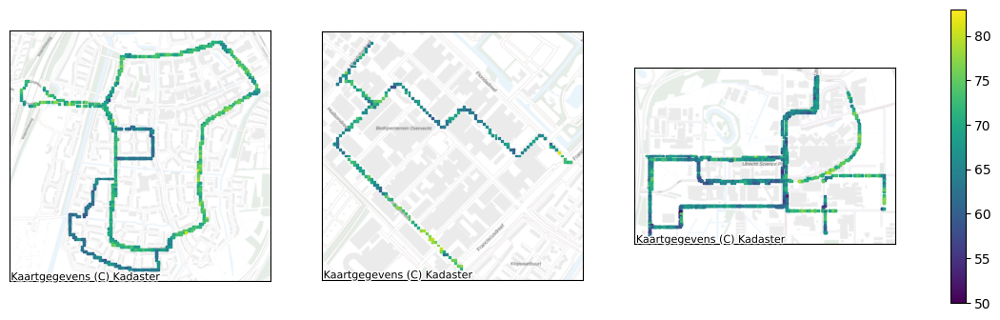

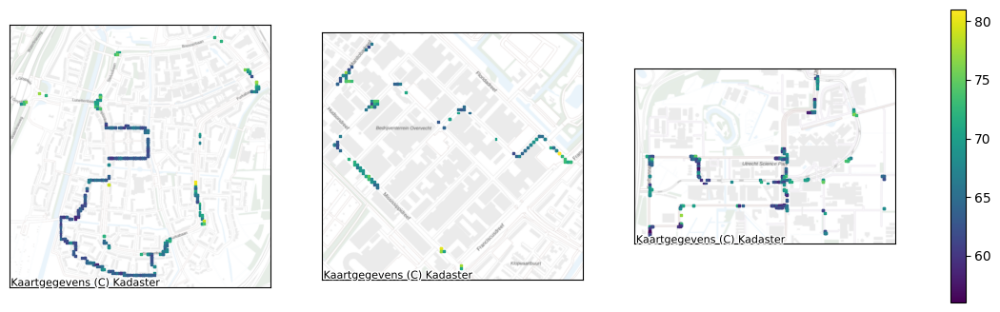

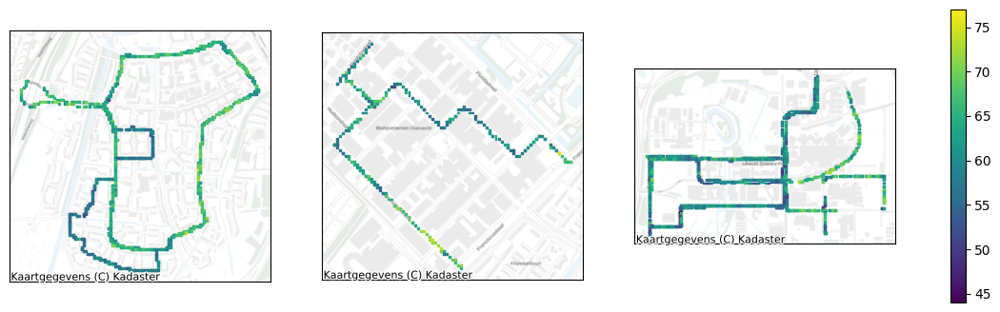

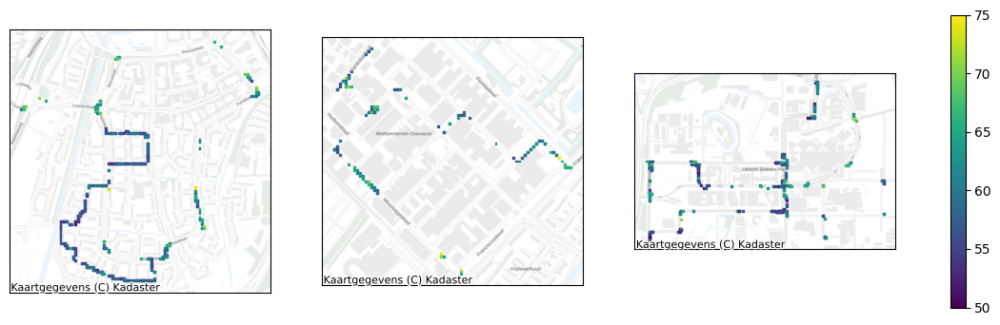

In [73]:
for c in ['dBA_rivm', 'dBA_raw', 'dBA_raw_slt20', 'dBA_noise_red', 'dBA_noise_red_slt20',
       'dBA_reg_adj', 'dBA_reg_adj_slt20', 'dBA_dual_red',
       'dBA_dual_red_slt20']:
    fig, axs = plt.subplots(1,3, figsize=(15,4))
    # fig.suptitle(f'{c} - true values')
    norm = mpl.colors.Normalize(vmin=gdf[c].min(), vmax=gdf[c].max())
    for i, a in enumerate((['Lunetten'], ['Overvecht'], ['Science Park'])):
        gdf[gdf['sub_area'].isin(a)].plot(column=c, marker='s', markersize=2, ax=axs[i], norm=norm)
        cx.add_basemap(ax=axs[i], source=cx.providers.nlmaps.grijs, crs=gdf.crs)
        axs[i].set_xticks([]); axs[i].set_yticks([])
    fig.colorbar(mpl.cm.ScalarMappable(norm=norm), ax=axs)
    plt.show()
    

## RIVM Diff

Difference  dBA_raw - dBA_rivm (trained on all areas)


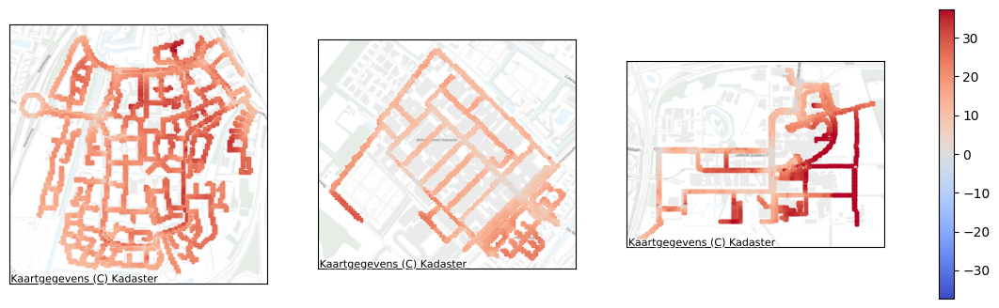

Difference  dBA_noise_red - dBA_rivm (trained on all areas)


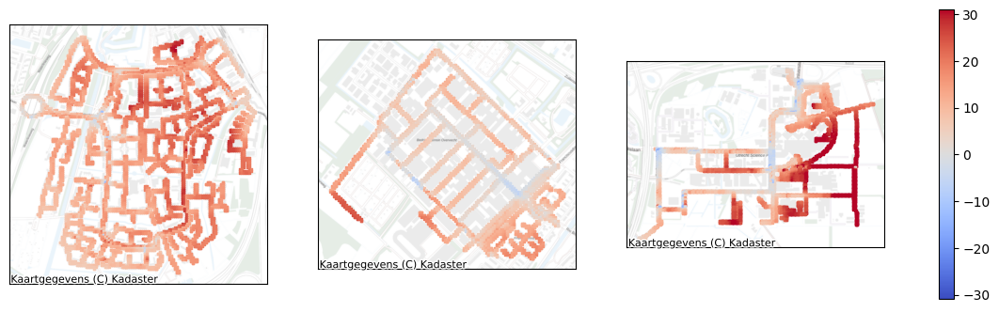

Difference  dBA_reg_adj - dBA_rivm (trained on all areas)


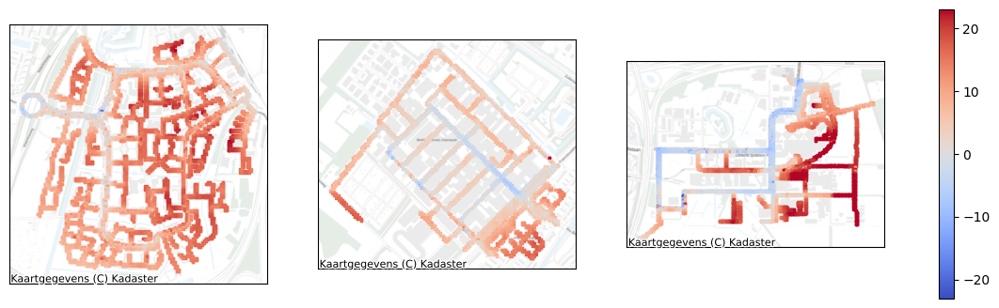

Difference  dBA_dual_red - dBA_rivm (trained on all areas)


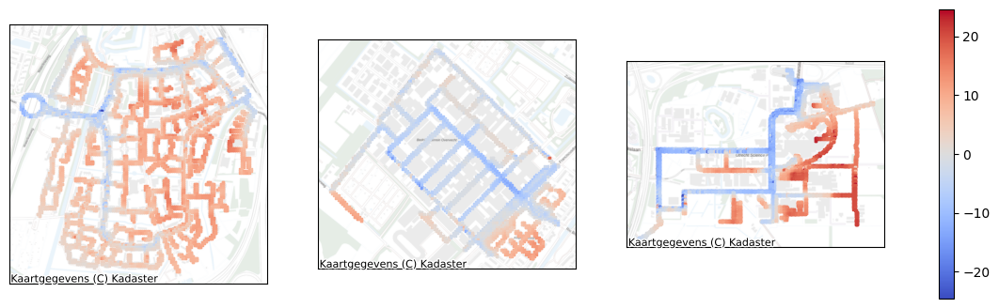

Difference  dBA_raw_slt20 - dBA_rivm (trained on all areas)


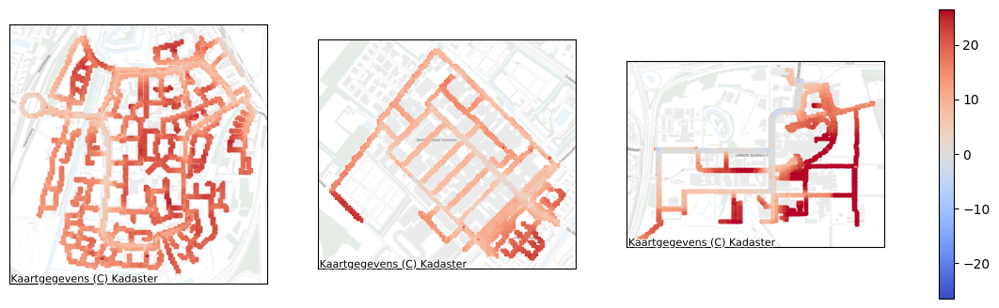

Difference  dBA_noise_red_slt20 - dBA_rivm (trained on all areas)


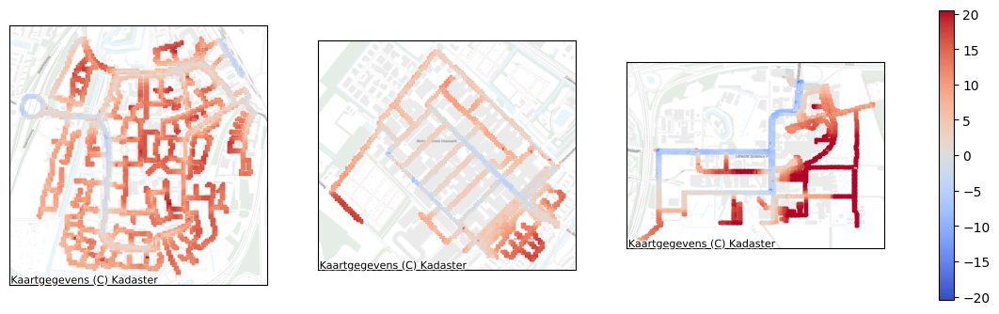

Difference  dBA_reg_adj_slt20 - dBA_rivm (trained on all areas)


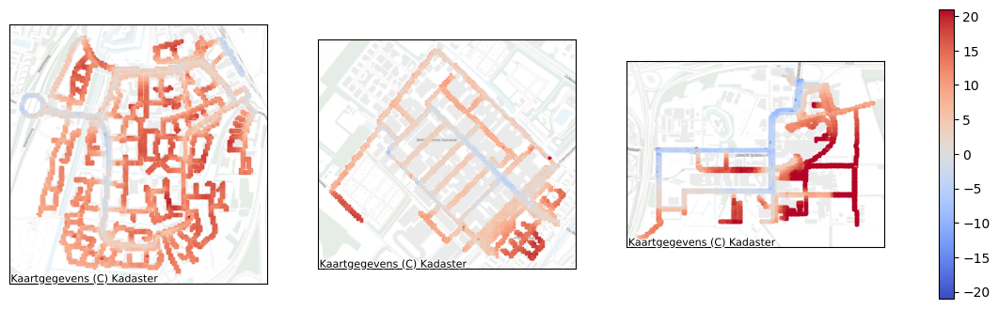

Difference  dBA_dual_red_slt20 - dBA_rivm (trained on all areas)


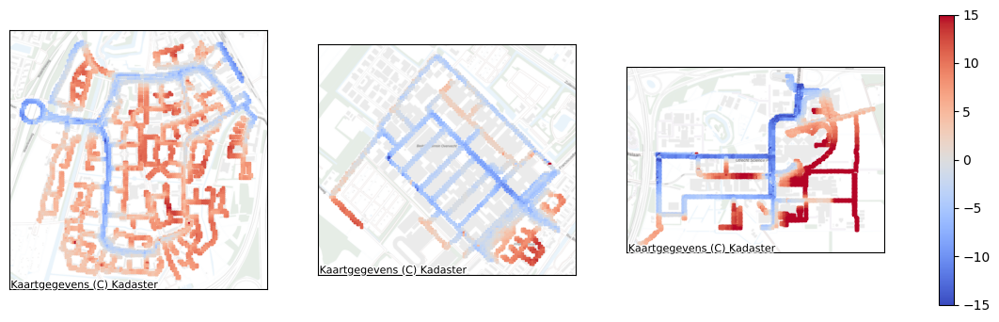

Difference  dBA_raw - dBA_rivm (trained on Lunnetten sub-area)


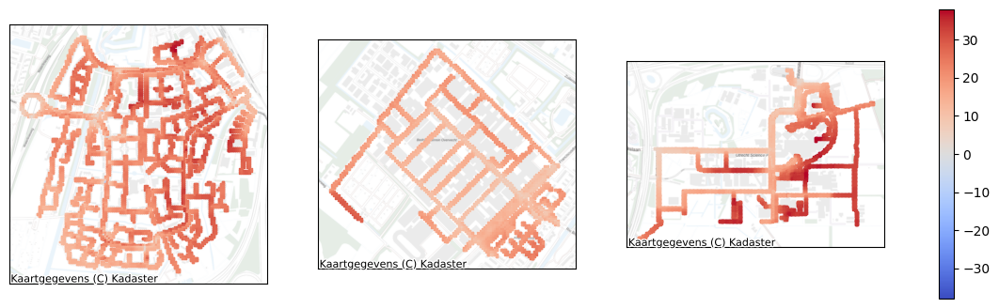

Difference  dBA_noise_red - dBA_rivm (trained on Lunnetten sub-area)


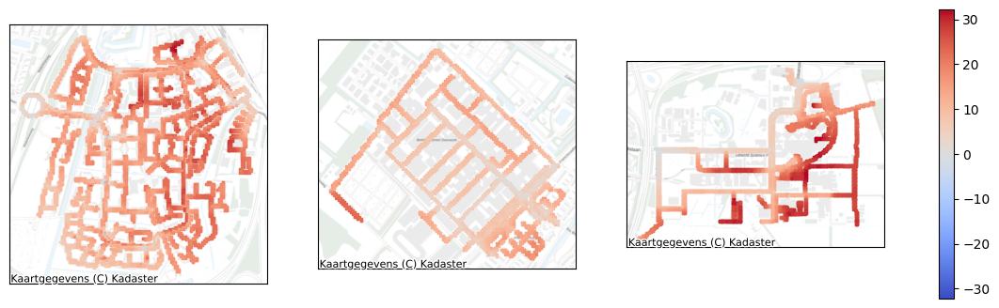

Difference  dBA_reg_adj - dBA_rivm (trained on Lunnetten sub-area)


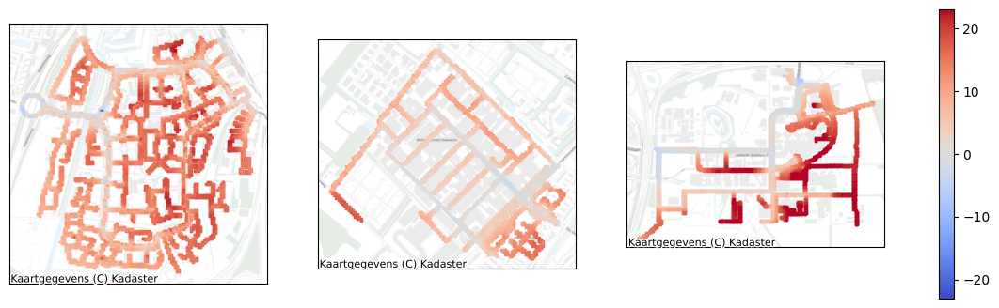

Difference  dBA_dual_red - dBA_rivm (trained on Lunnetten sub-area)


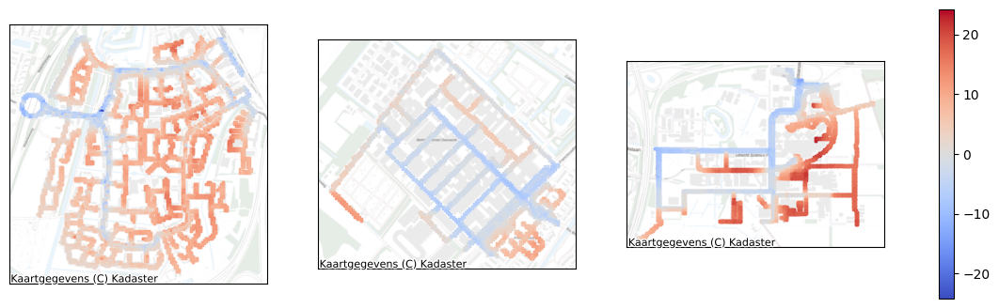

Difference  dBA_raw_slt20 - dBA_rivm (trained on Lunnetten sub-area)


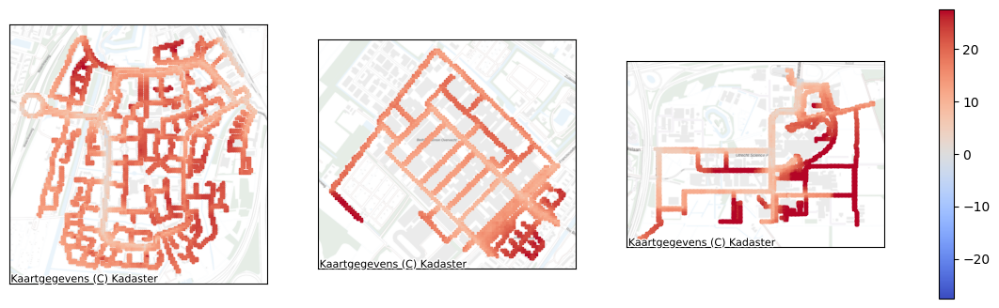

Difference  dBA_noise_red_slt20 - dBA_rivm (trained on Lunnetten sub-area)


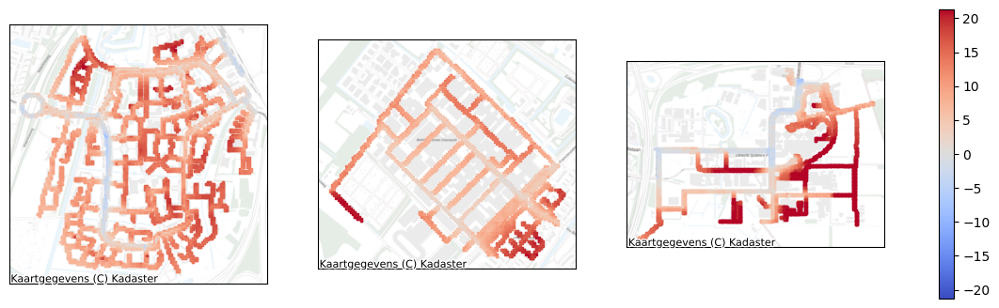

Difference  dBA_reg_adj_slt20 - dBA_rivm (trained on Lunnetten sub-area)


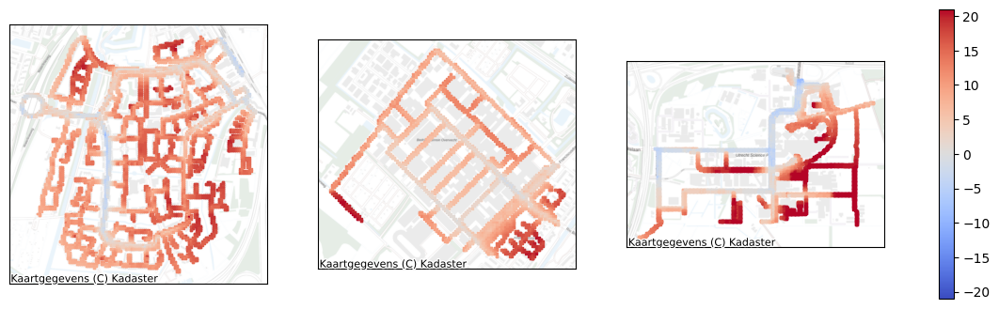

Difference  dBA_dual_red_slt20 - dBA_rivm (trained on Lunnetten sub-area)


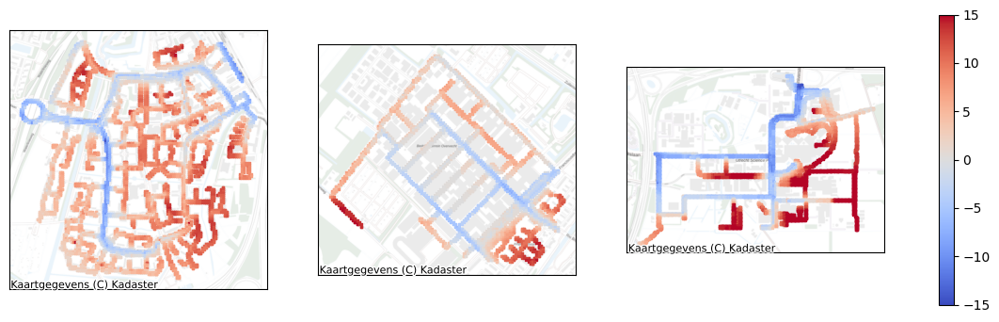

In [75]:
save_plots = True
import re
def do_compare(train, full, ycol, only_lun=False, save_to_file=False):
    m = get_new_model()
    if only_lun:
        train = train[train['sub_area'] == 'Lunetten']
    with HiddenPrints():
        m.fit(train[x_cols].values, train[c_cols].values, train[ycol].values)
    full['p'] = m.predict(full[x_cols].values, full[c_cols].values)
    rmse = root_mean_squared_error(full['dBA_rivm'].values, full['p'].values)
    corr = full['p'].corr(full['dBA_rivm'])

    # print(f'corr {ycol}, {only_lun}: {full['p'].corr(full['dBA_rivm'])}')
    full['p'] = full['p'] - full['dBA_rivm']
    
    # dba, spd = ycol, 'any'
    # if ycol[-5:] == 'slt20':
    #     dba, spd = dba[:-6], 'lt20'
    # area = 'Lun' if only_lun else 'all'
    # dmin = full['p'].min()
    # dmax = full['p'].max()
    
    # row = f'{dba} & {spd} & {area} & & {corr:.3f} & {dmin:.1f} & {dmax:.1f} & {rmse:.3f} \\\\'
    # row = re.sub(r'\_', r'\\textunderscore ', row)
    # print(row)



    fig, axs = plt.subplots(1,3, figsize=(15,4))
    figtitle = f'Difference  {ycol} - dBA_rivm (trained on {'Lunnetten sub-area' if only_lun else 'all areas'})'
    if save_to_file: print(figtitle)
    else: fig.suptitle(figtitle)

    norm = mpl.colors.CenteredNorm()
    # vmin=full['p'].min(), vmax=full['p'].max()
    
    
    for i, a in enumerate((['Lunetten'], ['Overvecht'], ['Science Park'])):
        full[full['sub_area'].isin(a)].plot(column='p', marker='s', markersize=2, ax=axs[i], norm=norm, cmap='coolwarm')
        cx.add_basemap(ax=axs[i], source=cx.providers.nlmaps.grijs, crs=full.crs)
        axs[i].set_xticks([]); axs[i].set_yticks([])
    fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap='coolwarm'), ax=axs)
    if save_to_file: fig.savefig(f'figs_diff/diff-{ycol}-{'lun' if only_lun else 'all'}.png',bbox_inches='tight')
    plt.show()

for ar in (False, True):
    for slt in (False, True):
        for db in ('dBA_raw', 'dBA_noise_red', 'dBA_reg_adj', 'dBA_dual_red'):
            col = f'{db}_slt20' if slt else db
            if slt:
                res = do_compare(train_slt20, gdf, col, ar, save_plots)
            else:
                res = do_compare(train_measured, gdf, col, ar, save_plots)

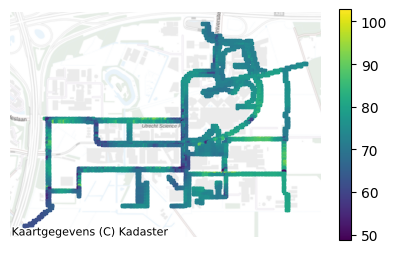

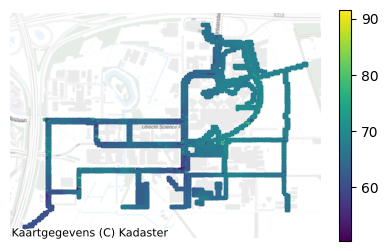

In [70]:
# comparing science park noise red VS science park noise red slt20

def slt_comparison_plot(train, train_slt20, full):

    # nay speed
    m = get_new_model()
    with HiddenPrints():
        m.fit(train[x_cols].values, train[c_cols].values, train['dBA_noise_red'].values)
    full['p'] = m.predict(full[x_cols].values, full[c_cols].values)
    fig, ax = plt.subplots(1,1, figsize=(5,3))
    
    
    
    norm = mpl.colors.Normalize(vmin=full['p'].min(), vmax=full['p'].max())

    full[full['sub_area'].isin(['Science Park'])].plot(column='p', marker='s', markersize=2, ax=ax, norm=norm, legend=True)
    cx.add_basemap(ax=ax, source=cx.providers.nlmaps.grijs, crs=full.crs)
    ax.set_axis_off()
    fig.colorbar(mpl.cm.ScalarMappable(norm=norm), ax=axs)
    plt.savefig('sltAnyComparison.png', dpi=700,bbox_inches='tight')
    plt.show()


    m = get_new_model()
    with HiddenPrints():
        m.fit(train_slt20[x_cols].values, train_slt20[c_cols].values, train_slt20['dBA_noise_red_slt20'].values)
    full['p'] = m.predict(full[x_cols].values, full[c_cols].values)
    fig, ax = plt.subplots(1,1, figsize=(5,3))
    
    
    
    norm = mpl.colors.Normalize(vmin=full['p'].min(), vmax=full['p'].max())

    full[full['sub_area'].isin(['Science Park'])].plot(column='p', marker='s', markersize=2, ax=ax, norm=norm, legend=True)
    cx.add_basemap(ax=ax, source=cx.providers.nlmaps.grijs, crs=full.crs)
    ax.set_axis_off()
    fig.colorbar(mpl.cm.ScalarMappable(norm=norm), ax=axs)
    plt.savefig('slt20Comparison.png', dpi=700,bbox_inches='tight')
    plt.show()

slt_comparison_plot(gdf_measured, gdf_measured_slt20, gdf)

In [76]:
gdf_measured['sub_area'].value_counts()

sub_area
Science Park    1179
Lunetten         905
Overvecht        265
Name: count, dtype: int64

In [72]:
gdf_measured_slt20.shape

(787, 37)